# 1. Import Libraries 

In [1]:
#%reload_ext autoreload
#%autoreload 2
%matplotlib notebook

In [2]:
PATH = "/home/khan74/scratch/new_DL_DES/"
sz=224
batch_size=64

In [3]:
import numpy as np
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.layers import Dropout, Flatten, Dense
from keras.applications import ResNet50, Xception
from keras.models import Model, Sequential
from keras.layers import Dense, GlobalAveragePooling2D
from keras import backend as K
from keras import optimizers
from keras.applications.resnet50 import preprocess_input
from keras.models import load_model

Using TensorFlow backend.


In [4]:
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd 
import numpy as np

In [5]:
import os
from os import listdir
from os.path import isfile, join, exists

# 2. Load Data / Create data_generators

In [6]:
train_df = pd.read_csv(PATH + 'deeplearning/data/training_set.csv')
val_df = pd.read_csv(PATH + 'deeplearning/data/validation_set.csv')
HP_crossmatch_df = pd.read_csv(PATH + 'deeplearning/data/high_prob_crossmatch_test_set.csv')
FO_crossmatch_df = pd.read_csv(PATH + 'deeplearning/data/full_overlap_crossmatch_test_set.csv')

#### flow_from_dir

In [7]:
train_data_dir = f'{PATH}deeplearning/data/train/'
validation_data_dir = f'{PATH}deeplearning/data/valid/'

HP_SDSS_test_data_dir = f'{PATH}deeplearning/data/HP_crossmatch_test/sdss/'
HP_DES_test_data_dir = f'{PATH}deeplearning/data/HP_crossmatch_test/des/'

FO_SDSS_test_data_dir = f'{PATH}deeplearning/data/FO_crossmatch_test/sdss/'
FO_DES_test_data_dir = f'{PATH}deeplearning/data/FO_crossmatch_test/des/'

In [8]:
train_datagen = ImageDataGenerator(
rescale = 1./255,
horizontal_flip = True,
vertical_flip = True,
fill_mode = "nearest",
zoom_range = 0.3,
width_shift_range = 0.3,
height_shift_range=0.3,
rotation_range=45)

valid_datagen = ImageDataGenerator(rescale = 1./255)

test_datagen = ImageDataGenerator(
rescale = 1./255,
horizontal_flip = True,
vertical_flip = True,
fill_mode = "nearest",
zoom_range = 0.3,
width_shift_range = 0.3,
height_shift_range=0.3,
rotation_range=45)




train_generator = train_datagen.flow_from_directory(
train_data_dir,
target_size = (sz, sz),
batch_size = batch_size, 
class_mode = "categorical",
shuffle = True,
interpolation = 'nearest')

validation_generator = valid_datagen.flow_from_directory(
validation_data_dir,
target_size = (sz, sz),
batch_size = 1,
class_mode = "categorical",
shuffle = False,
interpolation = 'nearest')




HP_SDSS_test_generator = test_datagen.flow_from_directory(
HP_SDSS_test_data_dir,
target_size = (sz, sz),
batch_size = 1,
class_mode = None,
shuffle = False)

HP_DES_test_generator = test_datagen.flow_from_directory(
HP_DES_test_data_dir,
target_size = (sz, sz),
batch_size = 1,
class_mode = None,
shuffle = False)




FO_SDSS_test_generator = test_datagen.flow_from_directory(
FO_SDSS_test_data_dir,
target_size = (sz, sz),
batch_size = 1,
class_mode = None,
shuffle = False)

FO_DES_test_generator = test_datagen.flow_from_directory(
FO_DES_test_data_dir,
target_size = (sz, sz),
batch_size = 1,
class_mode = None,
shuffle = False)

Found 36620 images belonging to 2 classes.
Found 963 images belonging to 2 classes.
Found 1066 images belonging to 1 classes.
Found 1066 images belonging to 1 classes.
Found 12596 images belonging to 1 classes.
Found 12596 images belonging to 1 classes.


# 3. Define Model 

In [9]:
num_of_classes = 2

base_model = Xception(input_shape=(sz,sz,3), weights='imagenet', include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.7)(x)
x = Dense(1024, activation="relu", name='second_last_layer')(x)
predictions = Dense(num_of_classes, activation="softmax")(x)

model_final = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model_final.summary()

model_final.compile(loss = "categorical_crossentropy", optimizer = optimizers.Adam(lr=0.0001), metrics=["accuracy"])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
__________________________________________________________________________________________________
block1_con

# 4. Train

## 1. Training Data 

<IPython.core.display.Javascript object>


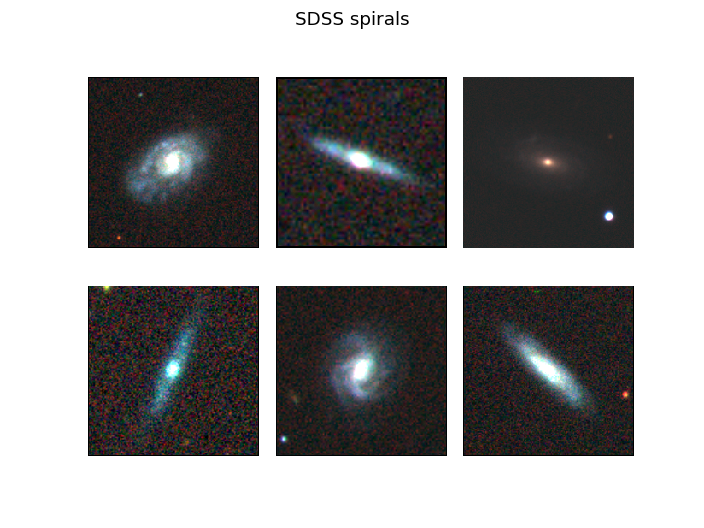

In [10]:
files_s = os.listdir(f'{PATH}deeplearning/data/train/spiral')[:20]
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('SDSS spirals')
    img = plt.imread(f'{PATH}deeplearning/data/train/spiral/{files_s[i]}')
    plt.imshow(img)
#plt.savefig('SDSS_spirals.pdf')

<IPython.core.display.Javascript object>


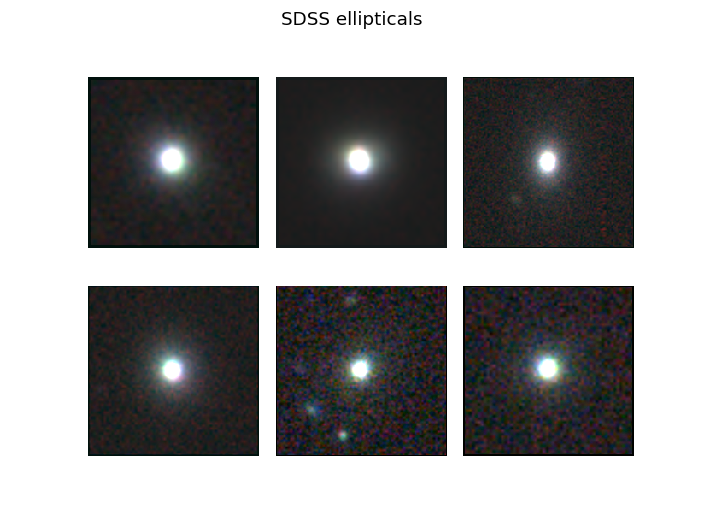

In [11]:
files_e = os.listdir(f'{PATH}deeplearning/data/train/elliptical')[:20]
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('SDSS ellipticals')
    img = plt.imread(f'{PATH}deeplearning/data/train/elliptical/{files_e[i+12]}')
    plt.imshow(img)
#plt.savefig('SDSS_elliptical.pdf')

## 2. Data Augmentation 

In [13]:
# Creat a datagen similar to train_datagen [except for rescaling, in order to visualize]

datagen = ImageDataGenerator(
#rescale = 1./255,
horizontal_flip = True,
vertical_flip = True,
fill_mode = "nearest",
zoom_range = 0.3,
width_shift_range = 0.3,
height_shift_range=0.3,
rotation_range=45)

<IPython.core.display.Javascript object>


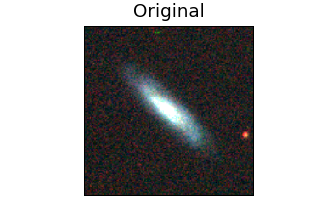

In [25]:
# Original Picture

files_s = os.listdir(f'{PATH}deeplearning/data/train/spiral')[:20]
x = plt.imread(f'{PATH}deeplearning/data/train/spiral/{files_s[5]}')

plt.figure( figsize=(3,2) )
plt.axis('Off')
plt.title('Original')
plt.imshow(x)

<IPython.core.display.Javascript object>


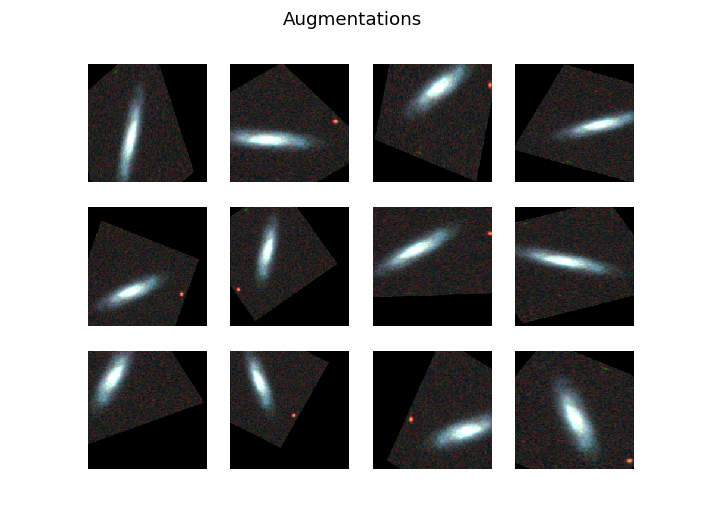

In [26]:
# Augmentations

x = x.reshape((1,) + x.shape)
i = 0
for batch in datagen.flow(x, batch_size=1):
    i += 1
    plt.subplot(3,4,i)
    plt.axis('Off')
    plt.suptitle('Augmentations')
    plt.imshow(batch[0])

    if i > 11:
        break  # otherwise the generator would loop indefinitely

## 3. Learning 

In [ ]:
K.clear_session()

In [12]:
os.environ["CUDA_VISIBLE_DEVICES"]='0'

In [13]:
history_1 = model_final.fit_generator(
train_generator,
steps_per_epoch = train_generator.n // train_generator.batch_size,
epochs = 1,
validation_data = validation_generator,
validation_steps = validation_generator.n // validation_generator.batch_size) 

Epoch 1/1
572/572 [==============================] - 1383s 2s/step - loss: 0.2606 - acc: 0.8936 - val_loss: 1.9794 - val_acc: 0.5597


In [14]:
model_final.save(PATH + 'deeplearning/weights/XceptionNew_freeze.h5')

In [15]:
#model_final = load_model('/home/khan74/scratch/data/SDSS/model_weights/Xception.h5')
model_final = load_model(PATH + 'deeplearning/weights/XceptionNew_freeze.h5')

#### (ii) Unfreeze [at Layer 40]

In [17]:
len(model_final.layers)

137

In [18]:
split_at = 40
for layer in model_final.layers[:split_at]: layer.trainable = False
for layer in model_final.layers[split_at:]: layer.trainable = True  
model_final.compile(loss = "categorical_crossentropy", optimizer = optimizers.Adam(lr=0.0001), metrics=["accuracy"])

In [21]:
#Select Call Backs

Early_Stop = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=3)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-8, verbose=1, mode='min')
checkpoint = keras.callbacks.ModelCheckpoint(PATH + 'deeplearning/weights/Xception_new_UnFreeze.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='min', period=1)


In [ ]:
%%time
history2 = model_final.fit_generator(train_generator, steps_per_epoch=train_generator.n // train_generator.batch_size, epochs=20, workers=1,
        validation_data=validation_generator, validation_steps=validation_generator.n // validation_generator.batch_size, callbacks=[Early_Stop, reduce_lr, checkpoint])

Epoch 1/20
572/572 [==============================] - 1380s 2s/step - loss: 0.0437 - acc: 0.9850 - val_loss: 0.2977 - val_acc: 0.9055

Epoch 00001: val_loss improved from inf to 0.29769, saving model to /home/khan74/scratch/new_DL_DES/deeplearning/weights/Xception_new_UnFreeze.h5
Epoch 2/20
572/572 [==============================] - 1339s 2s/step - loss: 0.0199 - acc: 0.9938 - val_loss: 0.2158 - val_acc: 0.9242

Epoch 00002: val_loss improved from 0.29769 to 0.21579, saving model to /home/khan74/scratch/new_DL_DES/deeplearning/weights/Xception_new_UnFreeze.h5
Epoch 3/20
572/572 [==============================] - 1714s 3s/step - loss: 0.0155 - acc: 0.9953 - val_loss: 0.8560 - val_acc: 0.8650

Epoch 00003: val_loss did not improve from 0.21579
Epoch 4/20
524/572 [==========================>...] - ETA: 2:24 - loss: 0.0129 - acc: 0.9963

#### (iii) Unfreeze [at Layer 2] 

In [9]:
model_final = load_model(PATH + 'deeplearning/weights/Xception_new_UnFreeze.h5')

In [11]:
split_at = 2
for layer in model_final.layers[:split_at]: layer.trainable = False
for layer in model_final.layers[split_at:]: layer.trainable = True  
model_final.compile(loss = "categorical_crossentropy", optimizer = optimizers.Adam(lr=0.0001), metrics=["accuracy"])

In [15]:
#Select Call Backs

Early_Stop = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=3)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-8, verbose=1, mode='min')
checkpoint = keras.callbacks.ModelCheckpoint(PATH + 'deeplearning/weights/Xception_new_UnFreeze_2.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='min', period=1)


In [16]:
%%time
history3 = model_final.fit_generator(train_generator, steps_per_epoch=train_generator.n // train_generator.batch_size, epochs=20, workers=1,
        validation_data=validation_generator, validation_steps=validation_generator.n // validation_generator.batch_size, callbacks=[Early_Stop, reduce_lr, checkpoint])

Epoch 1/20
572/572 [==============================] - 1782s 3s/step - loss: 0.0199 - acc: 0.9945 - val_loss: 0.0058 - val_acc: 0.9990

Epoch 00001: val_loss improved from inf to 0.00583, saving model to /home/khan74/scratch/new_DL_DES/deeplearning/weights/Xception_new_UnFreeze_2.h5
Epoch 2/20
572/572 [==============================] - 1528s 3s/step - loss: 0.0104 - acc: 0.9971 - val_loss: 0.0041 - val_acc: 0.9979

Epoch 00002: val_loss improved from 0.00583 to 0.00409, saving model to /home/khan74/scratch/new_DL_DES/deeplearning/weights/Xception_new_UnFreeze_2.h5
Epoch 3/20
572/572 [==============================] - 1397s 2s/step - loss: 0.0075 - acc: 0.9981 - val_loss: 0.0047 - val_acc: 0.9979

Epoch 00003: val_loss did not improve from 0.00409
Epoch 4/20
572/572 [==============================] - 1547s 3s/step - loss: 0.0067 - acc: 0.9982 - val_loss: 0.0181 - val_acc: 0.9969

Epoch 00004: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00004: val_loss did no

<IPython.core.display.Javascript object>


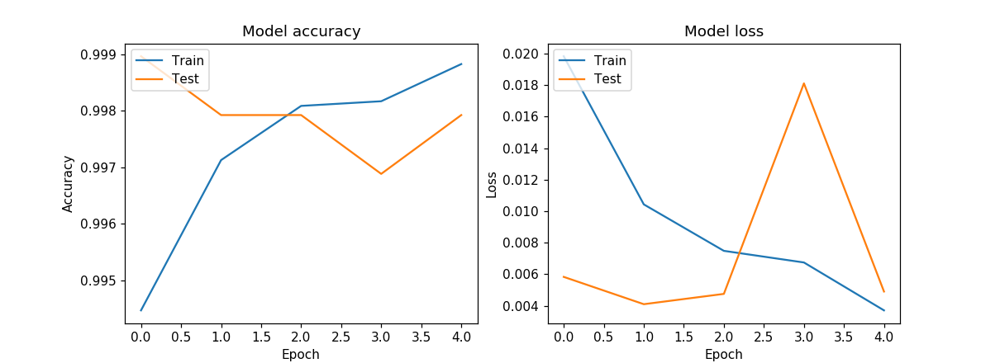

In [28]:
#Training Accuracy/Loss

plt.figure( figsize=(11,4) )

# Plot training & validation accuracy values
plt.subplot(1,2,1)
plt.plot(history3.history['acc'])
plt.plot(history3.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.subplot(1,2,2)
plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## 4. Save Final Model with Weights 

In [17]:
#model_final.save(PATH + 'deeplearning/weights/Xception_Final.h5')

In [9]:
model_final = load_model(PATH + 'deeplearning/weights/Xception_Final.h5')

# 5. HP Crossmatch Test 

### Load sklearn / Def metrics 

In [10]:
import itertools
from sklearn import metrics
from sklearn.metrics import confusion_matrix

In [11]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues,
                          figure_size = (11, 6),
                          save=0):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    #if normalize:
        #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    #else:
        #print('Confusion matrix, without normalization')

    #print(cm)

    plt.figure(figsize=figure_size)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    #plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
    if save==1:
        plt.savefig('confusion_matrix.pdf')
        plt.savefig('confusion_matrix.png')

In [12]:
# Define probability threshold mask

def threshold_mask(pred_array, prob_threshold = 0.9999):
    ''' 
    returns the positions in the array where the probability for each class is greater than prob_threshold
    
    pred_array: A one-hot encoded array of softmax probability outputs 
    prob_threshold: Float b/w 0 and 1 to use as a threshold mask
    '''
    pred_class_indices = np.argmax(pred_array, axis=1)
    pos = np.where( pred_array[ range( pred_array.shape[0] ), pred_class_indices ] > prob_threshold )[0]
    return pos


In [13]:
# Define top n predictions mask

def top_pred_mask(pred_array, n_top_predictions = 5000 ):
    '''
    reversedurn the positions of top n most confident predictions
    
    pred_array: A one-reversedencoded array of softmax probability outputs
    n_top_predictions: Num of top predictions
    '''
    pred_class_indices = np.argmax(pred_array, axis=1)
    pos = np.argsort( pred_array[ range( pred_array.shape[0] ), pred_class_indices ] ) 
    mask = np.flip( pos )
    return mask[: n_top_predictions]

### (i) SDSS 

In [15]:
HP_SDSS_predictions = model_final.predict_generator(HP_SDSS_test_generator,  verbose=1)

1066/1066 [==============================] - 42s 39ms/step


In [16]:
HP_SDSS_predicted_class_indices=np.argmax(HP_SDSS_predictions,axis=1)

labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in HP_SDSS_predicted_class_indices] )

filenames= np.array( HP_SDSS_test_generator.filenames )
#filenames = [x.split('/')[1].split('.')[0] for x in filenames]

results=pd.DataFrame({"Filename":filenames,
                      "Pred Labels":predictions,
                     "Predictions":HP_SDSS_predicted_class_indices})

In [17]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, HP_crossmatch_df, left_on='OBJID', right_on='SDSS_OBJID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [18]:
final[['OBJID','Predictions','Actuals', 'Pred Labels', 'P_EL_DEBIASED', 'P_CS_DEBIASED']].head()

,OBJID,Predictions,Actuals,Pred Labels,P_EL_DEBIASED,P_CS_DEBIASED
0,587724240151707767,0,False,elliptical,0.980,0.020
1,587724240152100955,0,False,elliptical,0.962,0.000
2,587724240152625253,0,False,elliptical,1.000,0.000
3,587724240153149575,0,False,elliptical,0.952,0.048
4,587724240154787988,1,True,spiral,0.010,0.990


In [19]:
print( "Accuracy: ", metrics.accuracy_score(final['Actuals'], final['Predictions']) )
print( "f1_score: ", metrics.f1_score(final['Actuals'], final['Predictions']))

Accuracy:  0.99906191369606
f1_score:  0.9990300678952473


<IPython.core.display.Javascript object>


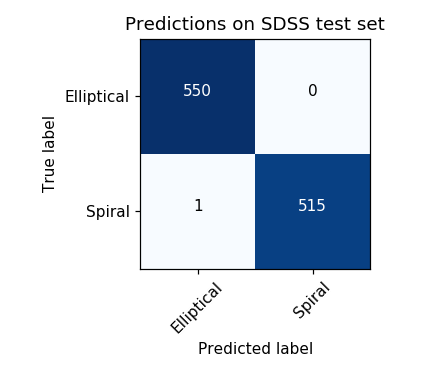

In [20]:
cm = confusion_matrix(final['Actuals'], final['Predictions'])
plot_confusion_matrix(cm, classes=['Elliptical', 'Spiral'], title="Predictions on SDSS test set", figure_size=(4,3.4))

#### Looking at some examples of correctly and incorrectly classified pictures 

In [21]:
#Seperate into Correct/InCorrect

Correctly_classified = final[ final.Predictions == final.Actuals ]
Incorrectly_classified = final[ final.Predictions != final.Actuals ]

In [22]:
#Seperate into Spiral/Elliptical

cc_spirals = Correctly_classified[ Correctly_classified.P_CS_DEBIASED > Correctly_classified.P_EL_DEBIASED ]
cc_elliptical = Correctly_classified[ Correctly_classified.P_CS_DEBIASED < Correctly_classified.P_EL_DEBIASED ]

ic_spirals = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED > Incorrectly_classified.P_EL_DEBIASED ]
ic_elliptical = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED < Incorrectly_classified.P_EL_DEBIASED ]

<IPython.core.display.Javascript object>


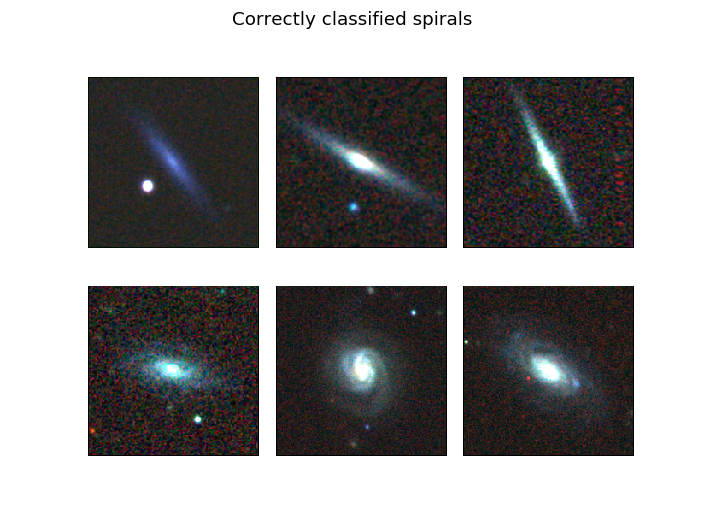

In [23]:
# Correct Spirals

for i, file in enumerate( np.random.choice(cc_spirals.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified spirals')
    img = plt.imread(HP_SDSS_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


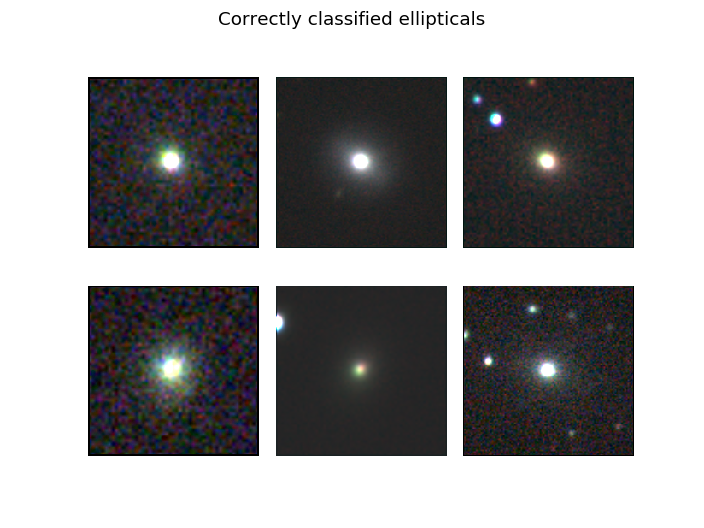

In [24]:
# Correct Ellipticals

for i, file in enumerate( np.random.choice(cc_elliptical.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified ellipticals')
    img = plt.imread(HP_SDSS_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


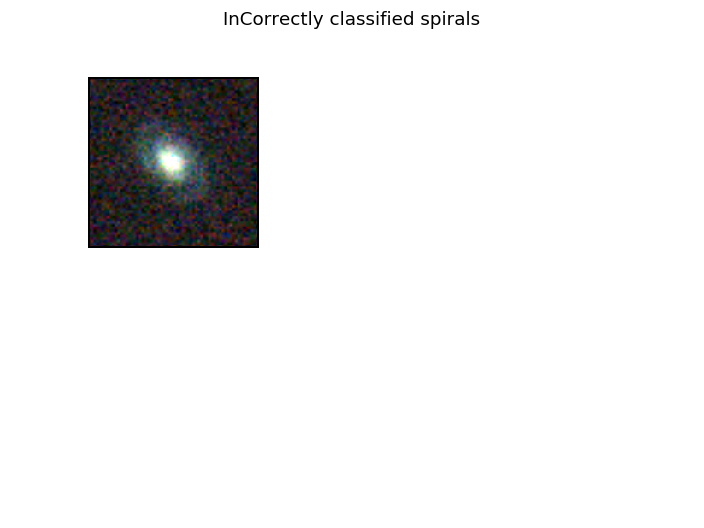

In [25]:
# InCorrect Spirals

for i, file in enumerate( np.random.choice(ic_spirals.Filename, len(ic_spirals), replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified spirals')
    img = plt.imread(HP_SDSS_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


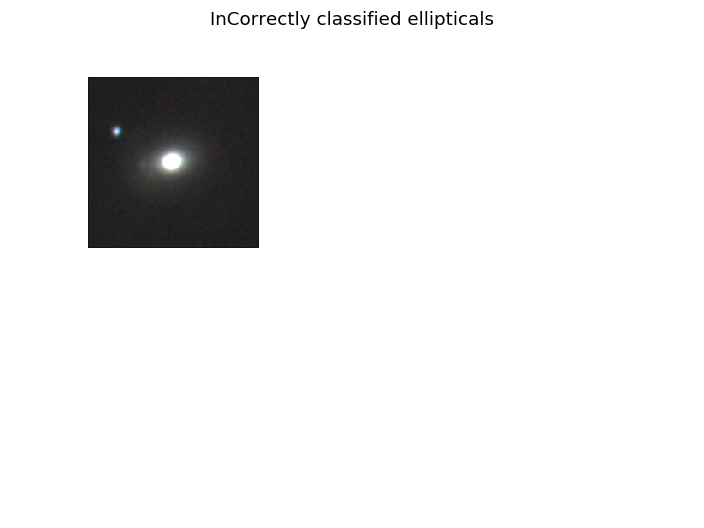

In [25]:
# InCorrect Ellipticals

for i, file in enumerate( np.random.choice(ic_elliptical.Filename, len(ic_elliptical), replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified ellipticals')
    img = plt.imread(HP_SDSS_test_data_dir + file)
    plt.imshow(img)

### (ii) DES 

In [37]:
HP_DES_predictions = model_final.predict_generator(HP_DES_test_generator,  verbose=1)

1066/1066 [==============================] - 14s 13ms/step


In [38]:
HP_DES_predicted_class_indices=np.argmax(HP_DES_predictions,axis=1)

labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in HP_DES_predicted_class_indices] )

filenames= np.array( HP_DES_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames,
                      "Pred Labels":predictions,
                     "Predictions":HP_DES_predicted_class_indices})

In [39]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, HP_crossmatch_df, left_on='OBJID', right_on='DES_COADD_OBJECT_ID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [40]:
final[['OBJID','Predictions','Actuals', 'Pred Labels', 'P_EL_DEBIASED', 'P_CS_DEBIASED']].head()

,OBJID,Predictions,Actuals,Pred Labels,P_EL_DEBIASED,P_CS_DEBIASED
0,102514934,0,False,elliptical,0.955,0.000
1,102534884,1,True,spiral,0.000,1.000
2,103077374,1,True,spiral,0.000,1.000
3,103087637,0,False,elliptical,0.950,0.000
4,103355741,1,True,spiral,0.015,0.985


In [41]:
print( "Accuracy: ", metrics.accuracy_score(final['Actuals'], final['Predictions']) )
print( "f1_score: ", metrics.f1_score(final['Actuals'], final['Predictions']))

Accuracy:  0.99812382739212
f1_score:  0.9980657640232108


<IPython.core.display.Javascript object>


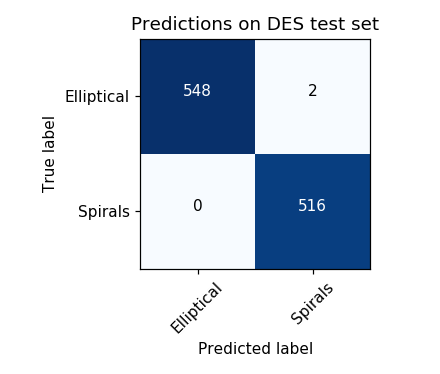

In [42]:
cm = confusion_matrix(final['Actuals'], final['Predictions'])
plot_confusion_matrix(cm, classes=['Elliptical', 'Spirals'], title="Predictions on DES test set", figure_size=(4,3.4))

#### Looking at some examples of correctly and incorrectly classified pictures 

In [49]:
#Seperate into Correct/InCorrect

Correctly_classified = final[ final.Predictions == final.Actuals ]
Incorrectly_classified = final[ final.Predictions != final.Actuals ]

In [50]:
#Seperate into Spiral/Elliptical

cc_spirals = Correctly_classified[ Correctly_classified.P_CS_DEBIASED > Correctly_classified.P_EL_DEBIASED ]
cc_elliptical = Correctly_classified[ Correctly_classified.P_CS_DEBIASED < Correctly_classified.P_EL_DEBIASED ]

ic_spirals = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED > Incorrectly_classified.P_EL_DEBIASED ]
ic_elliptical = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED < Incorrectly_classified.P_EL_DEBIASED ]

<IPython.core.display.Javascript object>


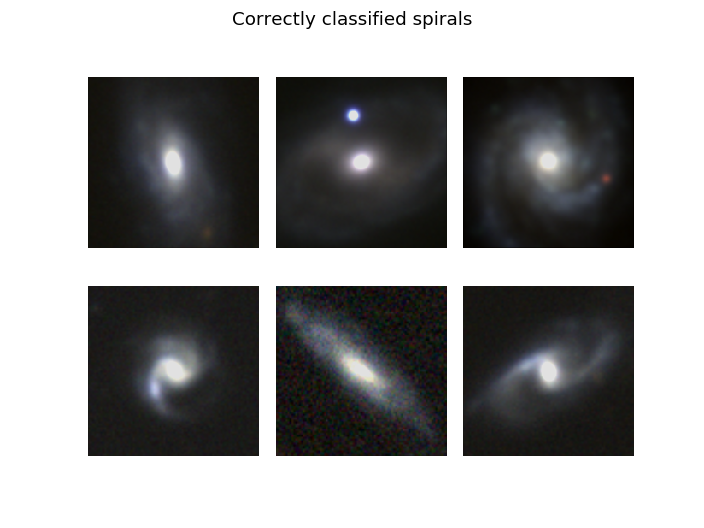

In [51]:
# Correct Spirals

for i, file in enumerate( np.random.choice(cc_spirals.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified spirals')
    img = plt.imread(HP_DES_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


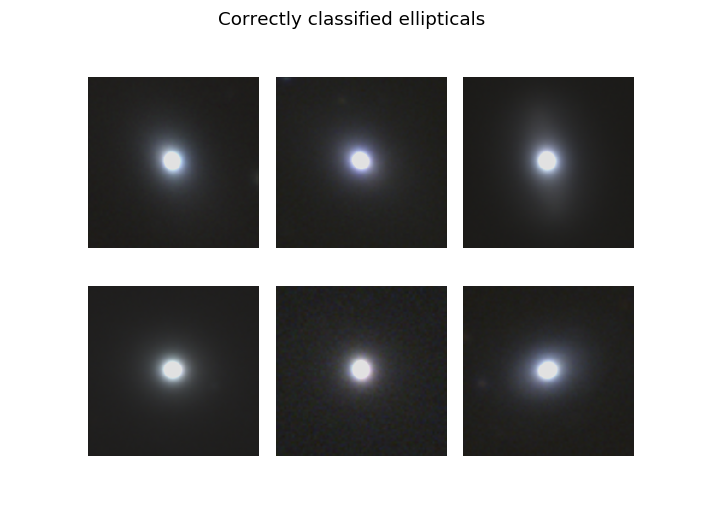

In [52]:
# Correct Ellipticals

for i, file in enumerate( np.random.choice(cc_elliptical.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified ellipticals')
    img = plt.imread(HP_DES_test_data_dir + file)
    plt.imshow(img)

In [53]:
# InCorrect Spirals

for i, file in enumerate( np.random.choice(ic_spirals.Filename, len(ic_spirals), replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified spirals')
    img = plt.imread(HP_DES_test_data_dir + file)
    plt.imshow(img)

ValueError: a must be non-empty

<IPython.core.display.Javascript object>


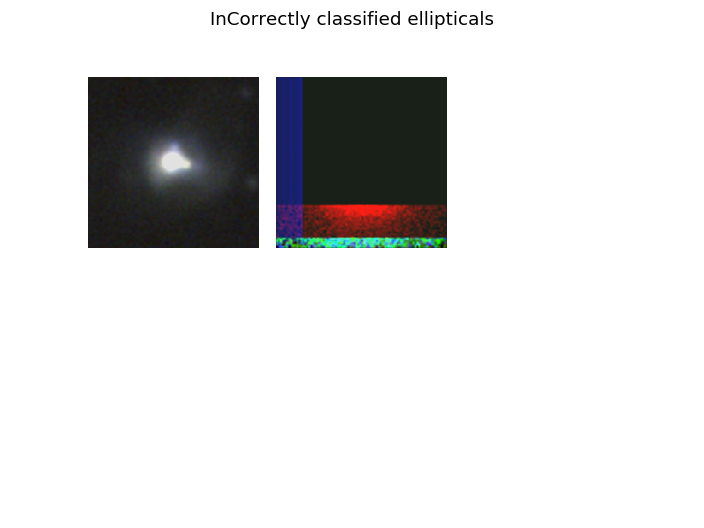

In [54]:
# InCorrect Elliptical

for i, file in enumerate( np.random.choice(ic_elliptical.Filename, len(ic_elliptical), replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified ellipticals')
    img = plt.imread(HP_DES_test_data_dir + file)
    plt.imshow(img)

# 6. FO Crossmatch Test  

### (i) SDSS 

In [123]:
FO_SDSS_predictions = model_final.predict_generator(FO_SDSS_test_generator,  verbose=1)

12596/12596 [==============================] - 416s 33ms/step


In [68]:
#mask = threshold_mask(FO_SDSS_predictions, prob_threshold=0.9999)
mask = threshold_mask(FO_SDSS_predictions, prob_threshold=0.999999)

In [69]:
FO_SDSS_predicted_class_indices=np.argmax(FO_SDSS_predictions,axis=1)


labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in FO_SDSS_predicted_class_indices] )

filenames= np.array( FO_SDSS_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames[mask],
                      "Pred Labels":predictions[mask],
                     "Predictions":FO_SDSS_predicted_class_indices[mask]})

In [70]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, FO_crossmatch_df, left_on='OBJID', right_on='SDSS_OBJID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [71]:
final[['OBJID','Predictions','Actuals', 'Pred Labels', 'P_EL_DEBIASED', 'P_CS_DEBIASED']].head()

,OBJID,Predictions,Actuals,Pred Labels,P_EL_DEBIASED,P_CS_DEBIASED
0,587724241764483150,1,True,spiral,0.090,0.910
1,587724241764745346,0,False,elliptical,0.573,0.365
2,587724241764810782,0,False,elliptical,0.665,0.117
3,587724241764810864,0,False,elliptical,0.899,0.082
4,587724241764810900,0,False,elliptical,0.677,0.058


In [72]:
final.shape

(6036, 250)

In [73]:
print( "Accuracy: ", metrics.accuracy_score(final['Actuals'], final['Predictions']) )
print( "f1_score: ", metrics.f1_score(final['Actuals'], final['Predictions']))

Accuracy:  0.9685222001325381
f1_score:  0.968791064388962


<IPython.core.display.Javascript object>


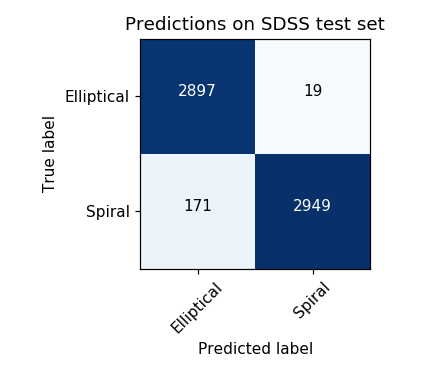

In [74]:
cm = confusion_matrix(final['Actuals'], final['Predictions'])
plot_confusion_matrix(cm, classes=['Elliptical', 'Spiral'], title="Predictions on SDSS test set", figure_size=(4,3.4))

#### Looking at some examples of correctly and incorrectly classified pictures 

In [131]:
#Seperate into Correct/InCorrect

Correctly_classified = final[ final.Predictions == final.Actuals ]
Incorrectly_classified = final[ final.Predictions != final.Actuals ]

In [132]:
#Seperate into Spiral/Elliptical

cc_spirals = Correctly_classified[ Correctly_classified.P_CS_DEBIASED > Correctly_classified.P_EL_DEBIASED ]
cc_elliptical = Correctly_classified[ Correctly_classified.P_CS_DEBIASED < Correctly_classified.P_EL_DEBIASED ]

ic_spirals = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED > Incorrectly_classified.P_EL_DEBIASED ]
ic_elliptical = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED < Incorrectly_classified.P_EL_DEBIASED ]

<IPython.core.display.Javascript object>


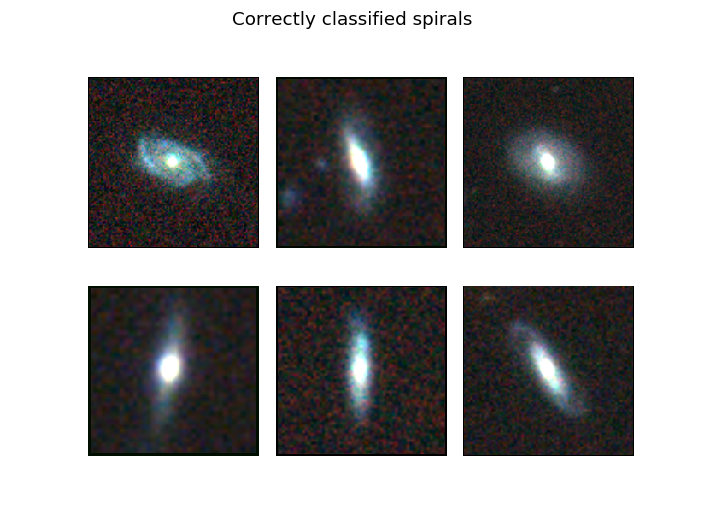

In [133]:
# Correct Spirals

for i, file in enumerate( np.random.choice(cc_spirals.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified spirals')
    img = plt.imread(FO_SDSS_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


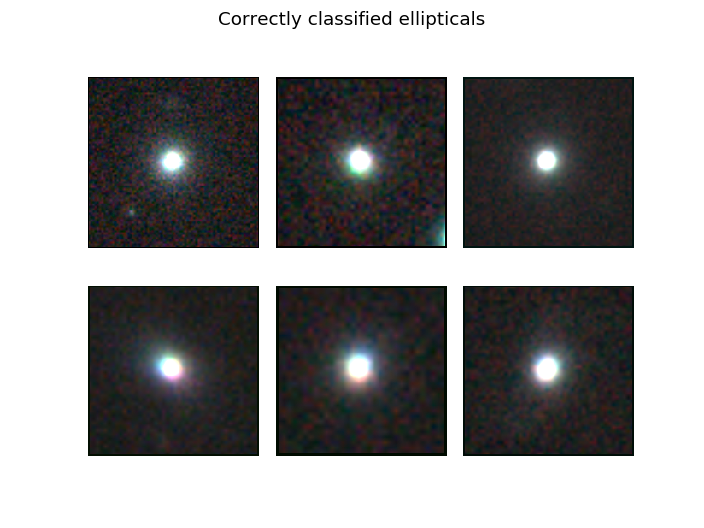

In [134]:
# Correct Ellipticals

for i, file in enumerate( np.random.choice(cc_elliptical.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified ellipticals')
    img = plt.imread(FO_SDSS_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


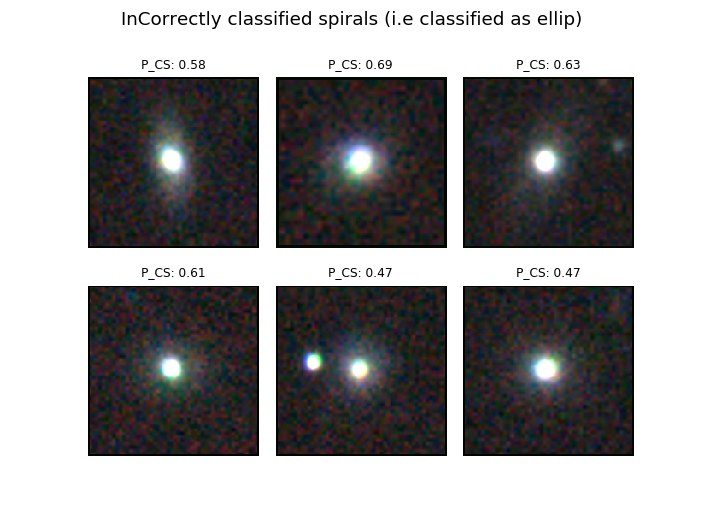

P_EL: 0.36
P_EL: 0.18
P_EL: 0.37
P_EL: 0.34
P_EL: 0.28
P_EL: 0.41


In [137]:
# InCorrect Spirals

for i, file in enumerate( np.random.choice(ic_spirals.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified spirals (i.e classified as ellip)')
    img = plt.imread(FO_SDSS_test_data_dir + file)
    plt.title('P_CS: '+ str(round(float(ic_spirals[ ic_spirals.Filename==file ]['P_CS_DEBIASED']),2)), fontsize=8)
    print('P_EL: '+ str(round(float(ic_spirals[ ic_spirals.Filename==file ]['P_EL_DEBIASED']),2)))
    plt.imshow(img)

<IPython.core.display.Javascript object>


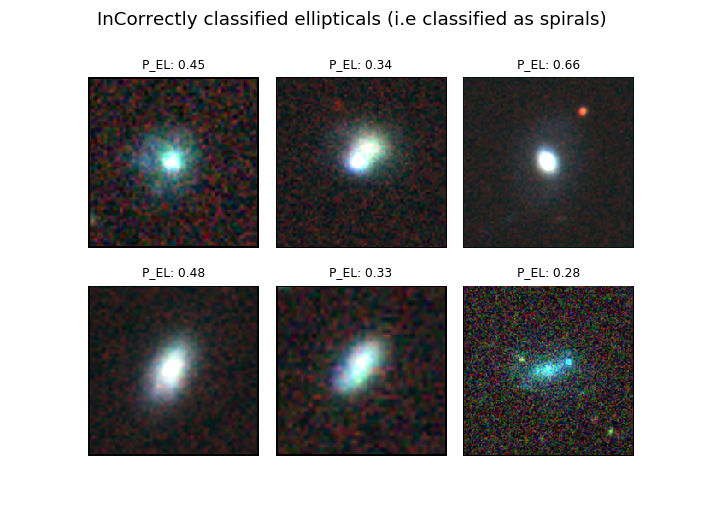

P_CS: 0.4
P_CS: 0.26
P_CS: 0.34
P_CS: 0.47
P_CS: 0.29
P_CS: 0.24


In [140]:
# InCorrect Elliptical

for i, file in enumerate( np.random.choice(ic_elliptical.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified ellipticals (i.e classified as spirals)')
    img = plt.imread(FO_SDSS_test_data_dir + file)
    plt.title('P_EL: '+ str(round(float(ic_elliptical[ ic_elliptical.Filename==file ]['P_EL_DEBIASED']),2)), fontsize=8)
    print('P_CS: '+ str(round(float(ic_elliptical[ ic_elliptical.Filename==file ]['P_CS_DEBIASED']),2)))
    plt.imshow(img)

### (ii) DES 

In [70]:
FO_DES_predictions = model_final.predict_generator(FO_DES_test_generator,  verbose=1)

12596/12596 [==============================] - 418s 33ms/step


In [71]:
mask = threshold_mask(FO_DES_predictions, prob_threshold=0.9999)

In [72]:
FO_DES_predicted_class_indices=np.argmax(FO_DES_predictions,axis=1)

#FO_SDSS_predicted_class_indices = FO_SDSS_predicted_class_indices[pos]

labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in FO_DES_predicted_class_indices] )

filenames= np.array( FO_DES_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames[mask],
                      "Labels":predictions[mask],
                     "Predictions":FO_DES_predicted_class_indices[mask]})

In [73]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, FO_crossmatch_df, left_on='OBJID', right_on='DES_COADD_OBJECT_ID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [74]:
final[['OBJID','Predictions','Actuals', 'Labels', 'P_EL_DEBIASED', 'P_CS_DEBIASED']].head()

,OBJID,Predictions,Actuals,Labels,P_EL_DEBIASED,P_CS_DEBIASED
0,100005001,1,True,spiral,0.048,0.923
1,100012309,1,True,spiral,0.057,0.875
2,100673914,1,True,spiral,0.124,0.834
3,104438235,1,True,spiral,0.049,0.884
4,104648618,1,True,spiral,0.130,0.819


In [75]:
final.shape

(6483, 250)

In [76]:
print( "Accuracy: ", metrics.accuracy_score(final['Actuals'], final['Predictions']) )
print( "f1_score: ", metrics.f1_score(final['Actuals'], final['Predictions']))

Accuracy:  0.965756594169366
f1_score:  0.9703763010408326


<IPython.core.display.Javascript object>


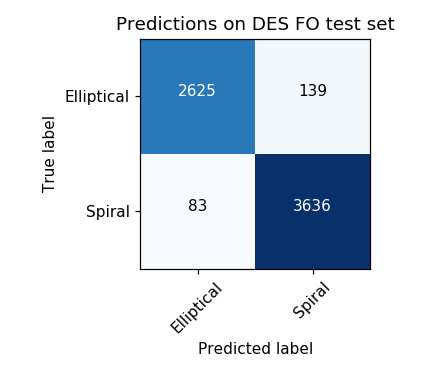

In [77]:
cm = confusion_matrix(final['Actuals'], final['Predictions'])
plot_confusion_matrix(cm, classes=['Elliptical', 'Spiral'], title="Predictions on DES FO test set", figure_size=(4,3.4))

#### Looking at some examples of correctly and incorrectly classified pictures 

In [78]:
#Seperate into Correct/InCorrect

Correctly_classified = final[ final.Predictions == final.Actuals ]
Incorrectly_classified = final[ final.Predictions != final.Actuals ]

In [79]:
#Seperate into Spiral/Elliptical

cc_spirals = Correctly_classified[ Correctly_classified.P_CS_DEBIASED > Correctly_classified.P_EL_DEBIASED ]
cc_elliptical = Correctly_classified[ Correctly_classified.P_CS_DEBIASED < Correctly_classified.P_EL_DEBIASED ]

ic_spirals = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED > Incorrectly_classified.P_EL_DEBIASED ]
ic_elliptical = Incorrectly_classified[ Incorrectly_classified.P_CS_DEBIASED < Incorrectly_classified.P_EL_DEBIASED ]

<IPython.core.display.Javascript object>


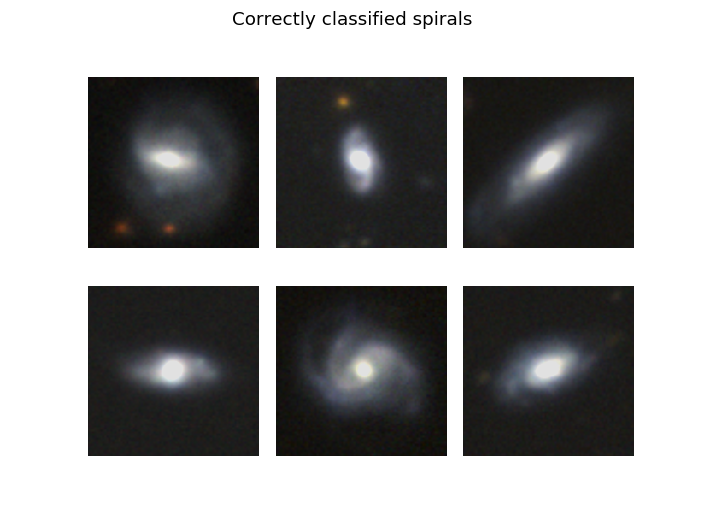

In [80]:
# Correct Spirals

for i, file in enumerate( np.random.choice(cc_spirals.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified spirals')
    img = plt.imread(FO_DES_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


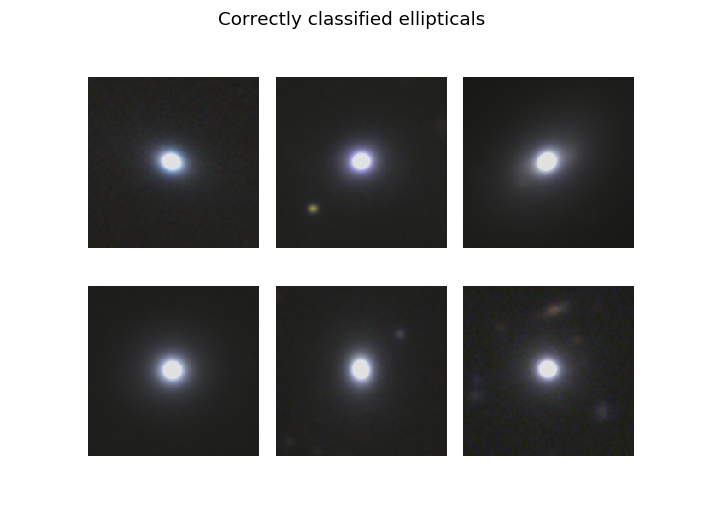

In [81]:
# Correct Ellipticals

for i, file in enumerate( np.random.choice(cc_elliptical.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('Correctly classified ellipticals')
    img = plt.imread(FO_DES_test_data_dir + file)
    plt.imshow(img)

<IPython.core.display.Javascript object>


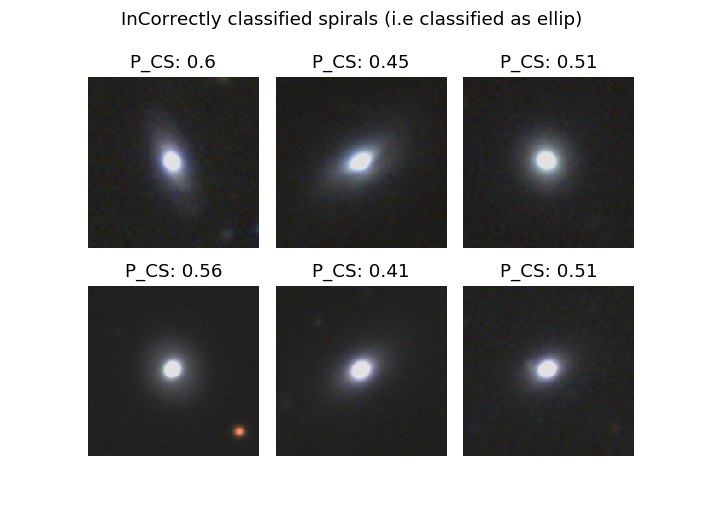

P_EL: 0.33
P_EL: 0.45
P_EL: 0.49
P_EL: 0.37
P_EL: 0.41
P_EL: 0.49


In [116]:
# InCorrect Spirals

for i, file in enumerate( np.random.choice(ic_spirals.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified spirals (i.e classified as ellip)')
    img = plt.imread(FO_DES_test_data_dir + file)
    plt.title('P_CS: '+ str(round(float(ic_spirals[ ic_spirals.Filename==file ]['P_CS_DEBIASED']),2)), fontsize=8)
    print('P_EL: '+ str(round(float(ic_spirals[ ic_spirals.Filename==file ]['P_EL_DEBIASED']),2)))
    plt.imshow(img)

<IPython.core.display.Javascript object>


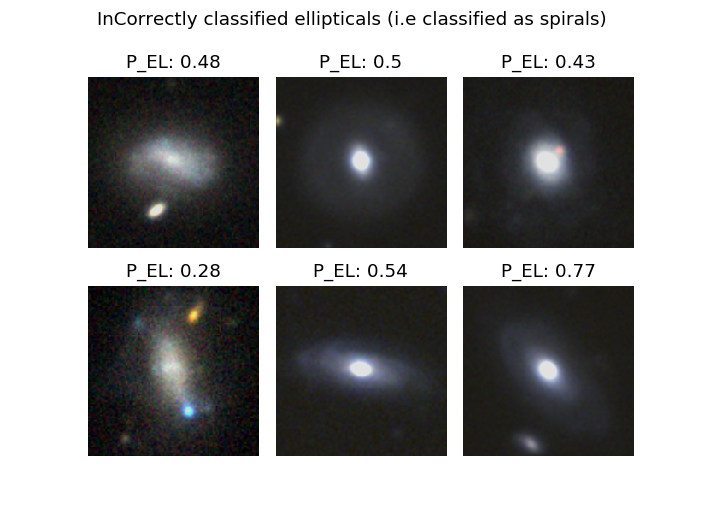

P_CS: 0.27
P_CS: 0.33
P_CS: 0.39
P_CS: 0.24
P_CS: 0.39
P_CS: 0.23


In [120]:
# InCorrect Elliptical

for i, file in enumerate( np.random.choice(ic_elliptical.Filename, 6, replace=False) ): 
    plt.subplot(2,3,i+1)
    plt.axis('Off')
    plt.subplots_adjust(wspace=0.1,hspace=0.05)
    plt.suptitle('InCorrectly classified ellipticals (i.e classified as spirals)')
    img = plt.imread(FO_DES_test_data_dir + file)
    plt.title('P_EL: '+ str(round(float(ic_elliptical[ ic_elliptical.Filename==file ]['P_EL_DEBIASED']),2)), fontsize=8)
    print('P_CS: '+ str(round(float(ic_elliptical[ ic_elliptical.Filename==file ]['P_CS_DEBIASED']),2)))
    plt.imshow(img)

# 7. Clustering 

### Load tSNE  / Define Clustering Model

In [14]:
from sklearn.manifold import TSNE
import matplotlib
from mpl_toolkits.mplot3d import Axes3D

In [15]:
clustering_model = Model(input = model_final.input, output = model_final.get_layer('second_last_layer').output)

/home/khan74/.conda/envs/myanaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`
  """Entry point for launching an IPython kernel.


### 1. HP Crossmatch Test 

#### (i) SDSS

In [12]:
HP_SDSS_out = clustering_model.predict_generator(HP_SDSS_test_generator, verbose=1)

1066/1066 [==============================] - 62s 59ms/step


In [13]:
tsne_HP_SDSS = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(HP_SDSS_out)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1066 samples in 0.037s...
[t-SNE] Computed neighbors for 1066 samples in 0.549s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1066
[t-SNE] Computed conditional probabilities for sample 1066 / 1066
[t-SNE] Mean sigma: 0.725976
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.341049
[t-SNE] KL divergence after 5000 iterations: 0.155222


In [16]:
filenames= np.array( HP_SDSS_test_generator.filenames )
results=pd.DataFrame({"Filename":filenames})

In [17]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, HP_crossmatch_df, left_on='OBJID', right_on='SDSS_OBJID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [18]:
labels = np.array( final['Actuals'] )

<IPython.core.display.Javascript object>


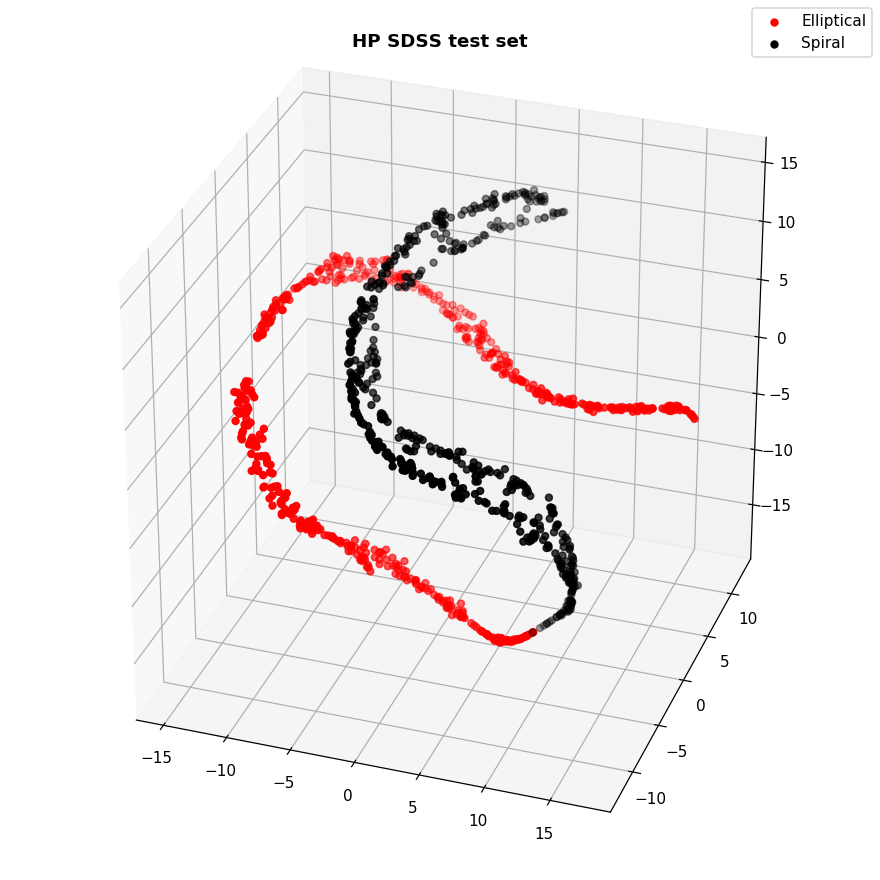

Text(0.5, 0.92, 'HP SDSS test set')

In [19]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_HP_SDSS[:,0][labels==0], tsne_HP_SDSS[:,2][labels==0], tsne_HP_SDSS[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_HP_SDSS[:,0][labels==1], tsne_HP_SDSS[:,2][labels==1], tsne_HP_SDSS[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('HP SDSS test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

#### (ii) DES

In [20]:
HP_DES_out = clustering_model.predict_generator(HP_DES_test_generator, verbose=1)

1066/1066 [==============================] - 58s 55ms/step


In [26]:
HP_DES_predictions = model_final.predict_generator(HP_DES_test_generator, verbose=1)

1066/1066 [==============================] - 15s 14ms/step


In [21]:
tsne_HP_DES = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(HP_DES_out)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1066 samples in 0.032s...
[t-SNE] Computed neighbors for 1066 samples in 0.539s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1066
[t-SNE] Computed conditional probabilities for sample 1066 / 1066
[t-SNE] Mean sigma: 0.328211
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.074913
[t-SNE] KL divergence after 5000 iterations: 0.168221


In [22]:
filenames= np.array( HP_DES_test_generator.filenames )
results=pd.DataFrame({"Filename":filenames})

In [23]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, HP_crossmatch_df, left_on='OBJID', right_on='DES_COADD_OBJECT_ID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [31]:
labels = np.array( final['Actuals'] )

<IPython.core.display.Javascript object>


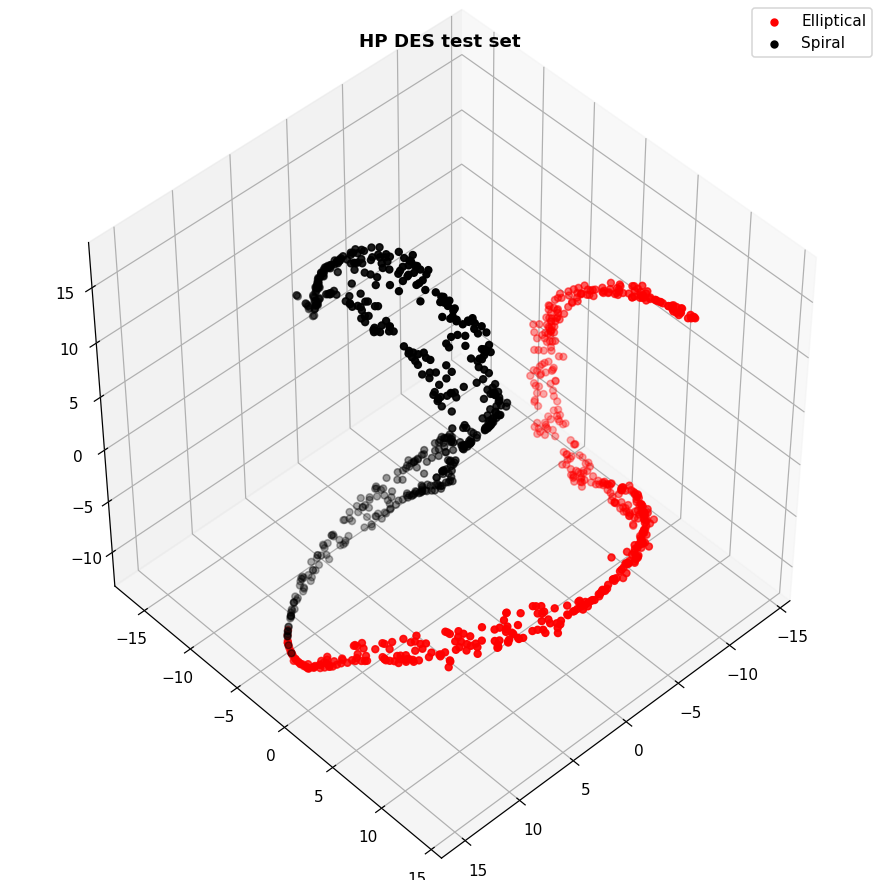

Text(0.5, 0.92, 'HP DES test set')

In [32]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_HP_DES[:,0][labels==0], tsne_HP_DES[:,2][labels==0], tsne_HP_DES[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_HP_DES[:,0][labels==1], tsne_HP_DES[:,2][labels==1], tsne_HP_DES[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('HP DES test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

### 2. FO Crossmatch Test 

#### (i) SDSS

In [33]:
FO_SDSS_out = clustering_model.predict_generator(FO_SDSS_test_generator, verbose=1)

12596/12596 [==============================] - 630s 50ms/step


In [34]:
FO_SDSS_predictions = model_final.predict_generator(FO_SDSS_test_generator, verbose=1)

12596/12596 [==============================] - 244s 19ms/step


In [75]:
mask = threshold_mask(FO_SDSS_predictions, prob_threshold=0.999999)

In [76]:
tsne_FO_SDSS = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(FO_SDSS_out[mask])

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6036 samples in 0.231s...
[t-SNE] Computed neighbors for 6036 samples in 5.752s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6036
[t-SNE] Computed conditional probabilities for sample 2000 / 6036
[t-SNE] Computed conditional probabilities for sample 3000 / 6036
[t-SNE] Computed conditional probabilities for sample 4000 / 6036
[t-SNE] Computed conditional probabilities for sample 5000 / 6036
[t-SNE] Computed conditional probabilities for sample 6000 / 6036
[t-SNE] Computed conditional probabilities for sample 6036 / 6036
[t-SNE] Mean sigma: 0.256021
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.400883
[t-SNE] KL divergence after 5000 iterations: 0.522084


In [77]:
FO_SDSS_predicted_class_indices=np.argmax(FO_SDSS_predictions,axis=1)


labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in FO_SDSS_predicted_class_indices] )

filenames= np.array( FO_SDSS_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames[mask],
                      "Pred Labels":predictions[mask],
                     "Predictions":FO_SDSS_predicted_class_indices[mask]})

In [78]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, FO_crossmatch_df, left_on='OBJID', right_on='SDSS_OBJID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [92]:
labels = np.array( final['Actuals'] )

In [81]:
labels = np.array( final['Predictions'] )

<IPython.core.display.Javascript object>


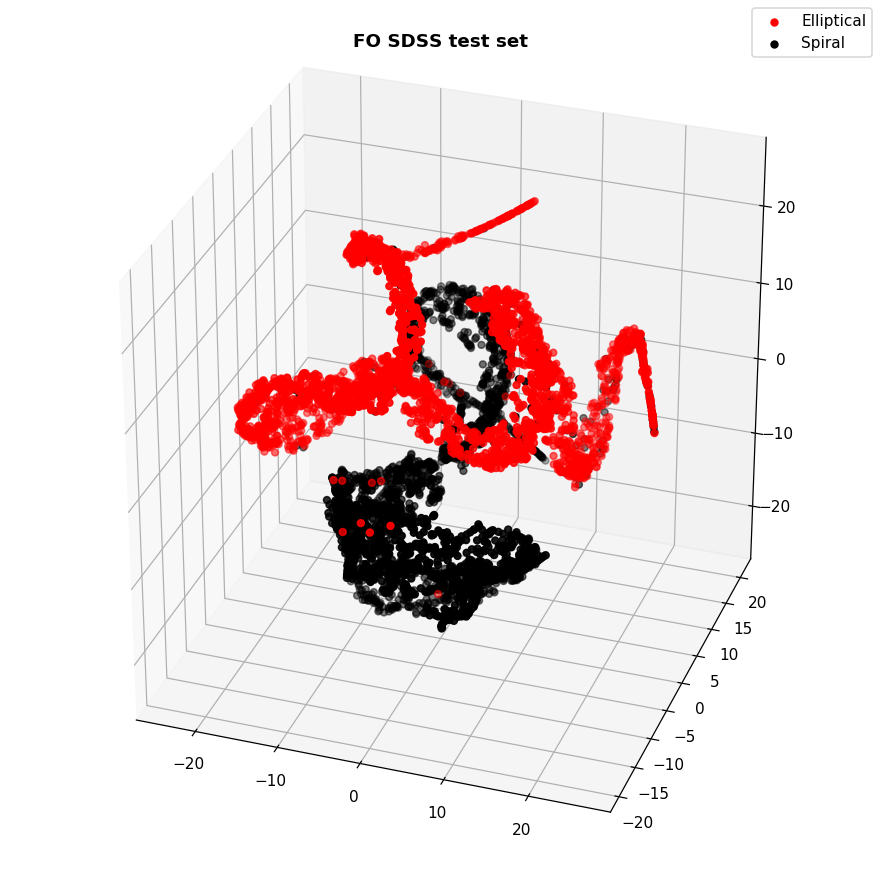

Text(0.5, 0.92, 'FO SDSS test set')

In [93]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_FO_SDSS[:,0][labels==0], tsne_FO_SDSS[:,2][labels==0], tsne_FO_SDSS[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_FO_SDSS[:,0][labels==1], tsne_FO_SDSS[:,2][labels==1], tsne_FO_SDSS[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('FO SDSS test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

#### (ii) DES

In [94]:
FO_DES_out = clustering_model.predict_generator(FO_DES_test_generator, verbose=1)

12596/12596 [==============================] - 776s 62ms/step


In [95]:
FO_DES_predictions = model_final.predict_generator(FO_DES_test_generator, verbose=1)

12596/12596 [==============================] - 284s 23ms/step


###### Mask by Prob threshold

In [96]:
mask = threshold_mask(FO_DES_predictions, prob_threshold=0.999999)

In [97]:
tsne_FO_DES = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(FO_DES_out[mask])

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4106 samples in 0.158s...
[t-SNE] Computed neighbors for 4106 samples in 3.494s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4106
[t-SNE] Computed conditional probabilities for sample 2000 / 4106
[t-SNE] Computed conditional probabilities for sample 3000 / 4106
[t-SNE] Computed conditional probabilities for sample 4000 / 4106
[t-SNE] Computed conditional probabilities for sample 4106 / 4106
[t-SNE] Mean sigma: 0.282584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.354237
[t-SNE] KL divergence after 5000 iterations: 0.429470


In [109]:
FO_DES_predicted_class_indices=np.argmax(FO_DES_predictions,axis=1)


labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in FO_DES_predicted_class_indices] )

filenames= np.array( FO_DES_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames[mask],
                      "Pred Labels":predictions[mask],
                     "Predictions":FO_DES_predicted_class_indices[mask]})

In [110]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, FO_crossmatch_df, left_on='OBJID', right_on='DES_COADD_OBJECT_ID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [112]:
labels = np.array( final['Actuals'] )

In [114]:
labels = np.array( final['Predictions'] )

<IPython.core.display.Javascript object>


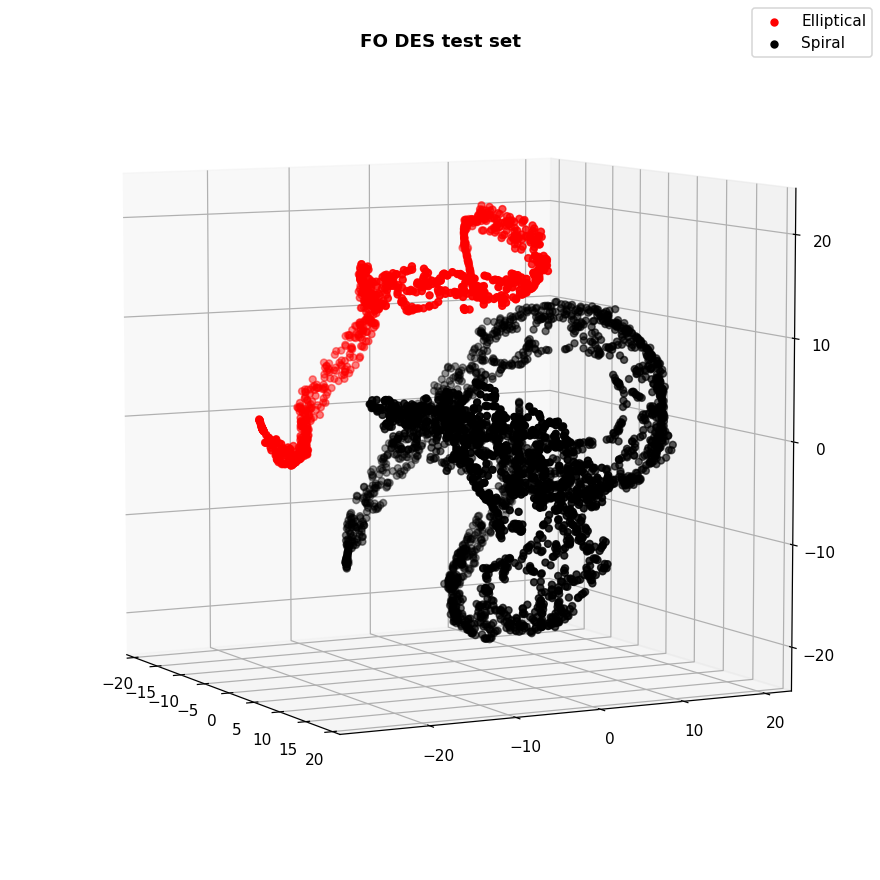

Text(0.5, 0.92, 'FO DES test set')

In [115]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_FO_DES[:,0][labels==0], tsne_FO_DES[:,2][labels==0], tsne_FO_DES[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_FO_DES[:,0][labels==1], tsne_FO_DES[:,2][labels==1], tsne_FO_DES[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('FO DES test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

###### Mask by top pred 

In [144]:
mask = top_pred_mask(FO_DES_predictions, 3000)

In [145]:
tsne_FO_DES = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(FO_DES_out[mask])

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.089s...
[t-SNE] Computed neighbors for 3000 samples in 2.295s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.392544
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.541054
[t-SNE] KL divergence after 5000 iterations: 0.386340


In [146]:
FO_DES_predicted_class_indices=np.argmax(FO_DES_predictions,axis=1)


labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in FO_DES_predicted_class_indices] )

filenames= np.array( FO_DES_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames[mask],
                      "Pred Labels":predictions[mask],
                     "Predictions":FO_DES_predicted_class_indices[mask]})

In [147]:
results['OBJID'] = results['Filename'].apply(lambda x: x.split('/')[-1][:-4]).astype('int64') 
final = pd.merge(results, FO_crossmatch_df, left_on='OBJID', right_on='DES_COADD_OBJECT_ID')
final['Actuals'] = final['P_CS_DEBIASED'] > final['P_EL_DEBIASED']

In [148]:
labels = np.array( final['Actuals'] )

In [156]:
labels = np.array( final['Predictions'] )

<IPython.core.display.Javascript object>


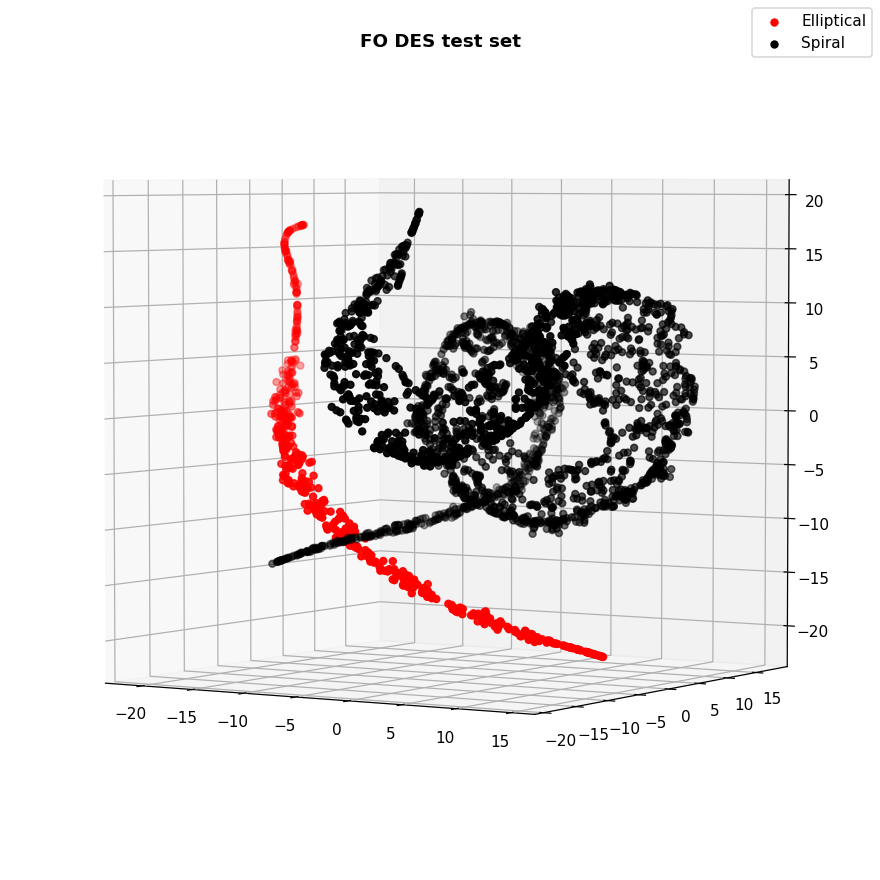

Text(0.5, 0.92, 'FO DES test set')

In [157]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_FO_DES[:,0][labels==0], tsne_FO_DES[:,2][labels==0], tsne_FO_DES[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_FO_DES[:,0][labels==1], tsne_FO_DES[:,2][labels==1], tsne_FO_DES[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('FO DES test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

### 3. Unlabelled DES 

In [16]:
UL_test_data_dir = f'{PATH}deeplearning/data/unlabelled/'

In [17]:
UL_test_generator = test_datagen.flow_from_directory(
UL_test_data_dir,
target_size = (sz, sz),
batch_size = 1,
class_mode = None,
shuffle = False)

Found 8983 images belonging to 1 classes.


In [18]:
UL_out = clustering_model.predict_generator(UL_test_generator, verbose=1)

8983/8983 [==============================] - 255s 28ms/step


In [19]:
UL_predictions = model_final.predict_generator(UL_test_generator, verbose=1)

8983/8983 [==============================] - 136s 15ms/step


###### Mask by Prob threshold 

In [98]:
mask = threshold_mask(UL_predictions, prob_threshold=0.999999)

In [22]:
tsne_UL = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(UL_out[mask])

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3009 samples in 0.105s...
[t-SNE] Computed neighbors for 3009 samples in 2.380s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3009
[t-SNE] Computed conditional probabilities for sample 2000 / 3009
[t-SNE] Computed conditional probabilities for sample 3000 / 3009
[t-SNE] Computed conditional probabilities for sample 3009 / 3009
[t-SNE] Mean sigma: 0.335909
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.146950
[t-SNE] KL divergence after 5000 iterations: 0.384178


In [25]:
labels = ( np.argmax(UL_predictions, axis=1) )[mask]

<IPython.core.display.Javascript object>


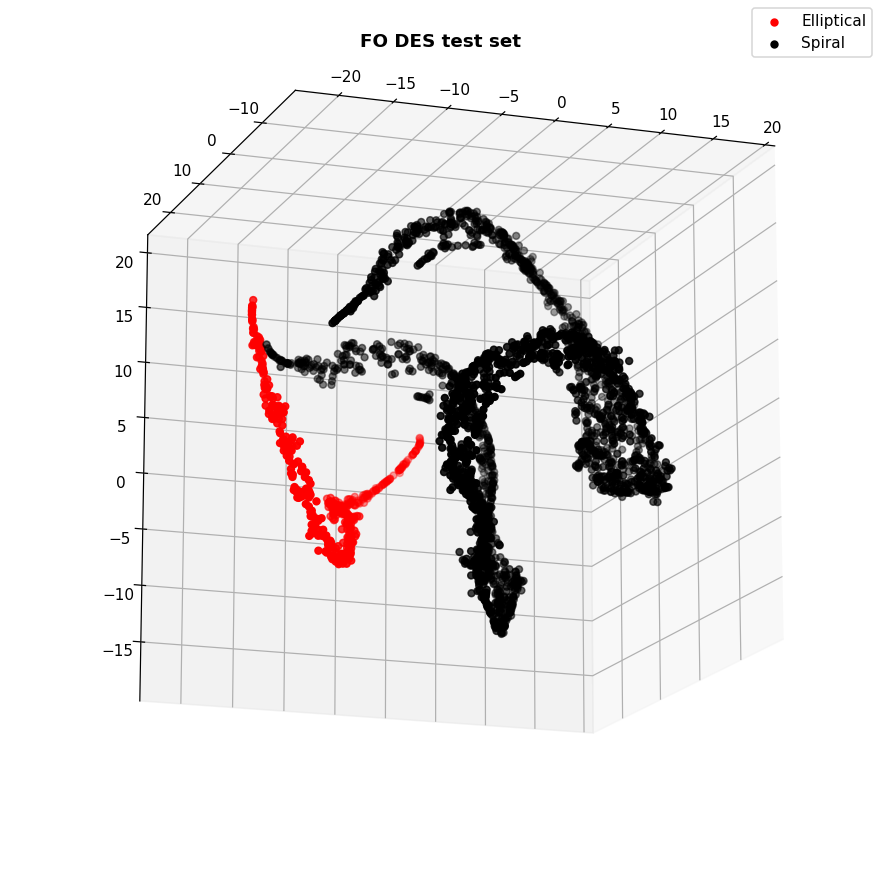

Text(0.5, 0.92, 'FO DES test set')

In [26]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_UL[:,0][labels==0], tsne_UL[:,2][labels==0], tsne_UL[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_UL[:,0][labels==1], tsne_UL[:,2][labels==1], tsne_UL[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('FO DES test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

###### Mask by top pred 

In [129]:
mask = top_pred_mask(UL_predictions, 4500)

In [130]:
tsne_UL = TSNE(n_components=3, verbose=1, n_iter=5000, learning_rate=10).fit_transform(UL_out[mask])

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4500 samples in 0.147s...
[t-SNE] Computed neighbors for 4500 samples in 3.535s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4500
[t-SNE] Computed conditional probabilities for sample 2000 / 4500
[t-SNE] Computed conditional probabilities for sample 3000 / 4500
[t-SNE] Computed conditional probabilities for sample 4000 / 4500
[t-SNE] Computed conditional probabilities for sample 4500 / 4500
[t-SNE] Mean sigma: 0.192622
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.245087
[t-SNE] KL divergence after 5000 iterations: 0.442916


In [131]:
labels = ( np.argmax(UL_predictions, axis=1) )[mask]

<IPython.core.display.Javascript object>


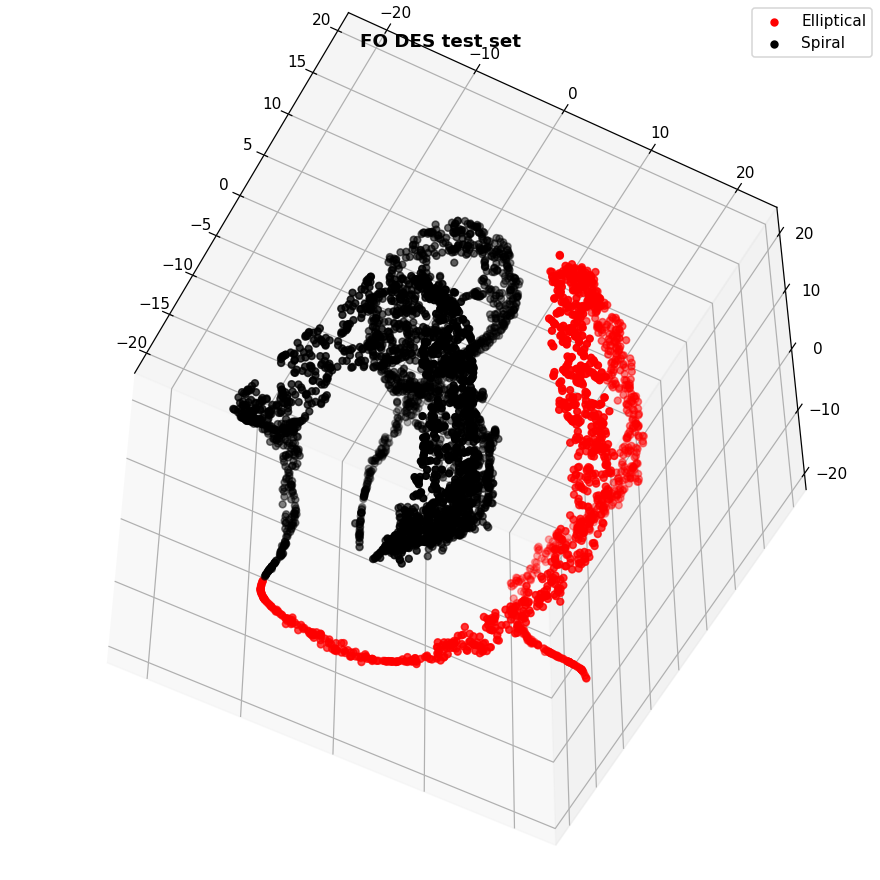

Text(0.5, 0.92, 'FO DES test set')

In [132]:
fig = plt.figure(figsize=(8,8))
ax = Axes3D(fig)

ax.scatter3D(tsne_UL[:,0][labels==0], tsne_UL[:,2][labels==0], tsne_UL[:,1][labels==0], c='red', label='Elliptical')
ax.scatter3D(tsne_UL[:,0][labels==1], tsne_UL[:,2][labels==1], tsne_UL[:,1][labels==1], c='black', label='Spiral')

ax.legend(loc='upper right')
#ax.view_init(elev=30, azim=-170)
ax.view_init(elev=30, azim=-71)

font = {'fontname':'Times New Roman'}
plt.title('FO DES test set', fontsize=12, fontweight="bold", pad=15, **font)

#plt.savefig('tSNE_SDSS.pdf')

###### Looking at Pictures

In [ ]:
mask = threshold_mask(UL_predictions, prob_threshold=0.999999)

In [133]:
mask = top_pred_mask(UL_predictions, 4500)

In [134]:
UL_predicted_class_indices=np.argmax(UL_predictions,axis=1)


labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = np.array( [labels[k] for k in UL_predicted_class_indices] )

filenames= np.array( UL_test_generator.filenames )

results=pd.DataFrame({"Filename":filenames[mask],
                      "Pred Labels":predictions[mask],
                     "Predictions":UL_predicted_class_indices[mask]})

In [135]:
spirals = results[ results.Predictions==1 ]

In [136]:
spirals.shape

(3102, 3)

In [137]:
elliptical = results[ results.Predictions==0 ]

In [138]:
elliptical.shape

(1398, 3)

In [139]:
def plot_pred(df, start_index = 0):
    
    for i, index in enumerate( df.index[start_index:start_index+10] ):
    
        row = results.loc[index]
        filename = row.Filename
        type_ = row['Pred Labels']

        img_path = UL_test_data_dir + str(filename)

        img = plt.imread(img_path )

        plt.subplot(2,5,i+1)
        plt.axis('Off')
        plt.subplots_adjust(wspace=0.1,hspace=0.05)
        plt.imshow(img)
        plt.suptitle('Predicted ' + type_)
        
    plt.show()

<IPython.core.display.Javascript object>


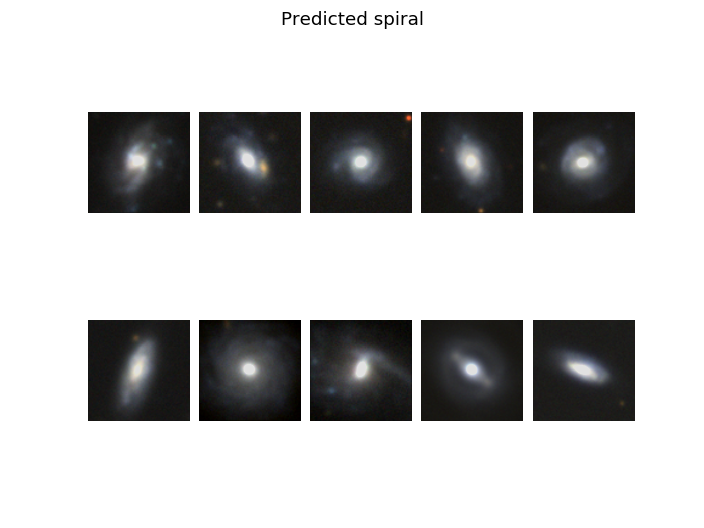

In [149]:
plot_pred(spirals, 2190)

<IPython.core.display.Javascript object>


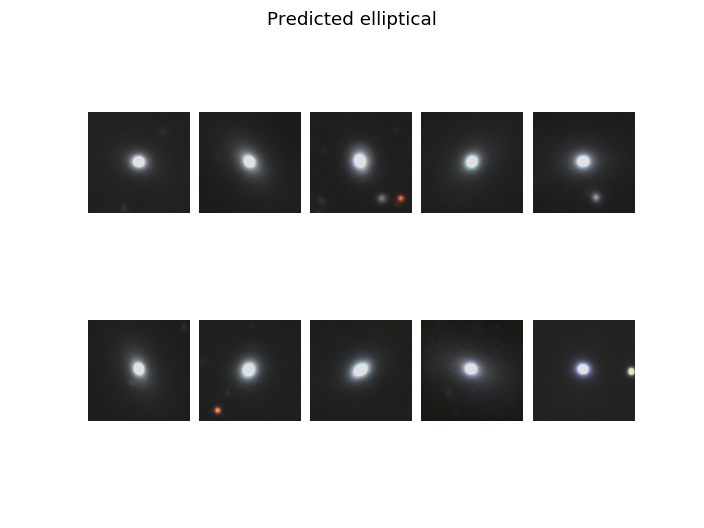

In [148]:
plot_pred(elliptical, 1200)